<a href="https://colab.research.google.com/github/solive-11/dissertation-weed-detection/blob/main/notebooks/02_dataset_preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# ============================================================
# 02_dataset_preparation.ipynb
# Step 1: Project paths and reproducibility
# ============================================================

from pathlib import Path
import random
import numpy as np
import os

# ------------------------------------------------------------
# 1. Mount Google Drive
# ------------------------------------------------------------

from google.colab import drive
drive.mount("/content/drive")


# ------------------------------------------------------------
# 2. Project directories
# ------------------------------------------------------------

PROJECT_ROOT = Path(
    "/content/drive/MyDrive/dissertation_weed_detection"
)

DATA_DIR = PROJECT_ROOT / "01_data"

RAW_DIR = DATA_DIR / "raw"
EXTRACTED_DIR = DATA_DIR / "extracted"
PROCESSED_DIR = DATA_DIR / "processed"

NOTEBOOK_DIR = PROJECT_ROOT / "02_notebooks"
RESULTS_DIR = PROJECT_ROOT / "05_results"


# ------------------------------------------------------------
# 3. Verify directories
# ------------------------------------------------------------

print("PROJECT ROOT :", PROJECT_ROOT)
print("EXTRACTED    :", EXTRACTED_DIR)
print("PROCESSED    :", PROCESSED_DIR)

print("\nDirectory status:")
print("Extracted exists :", EXTRACTED_DIR.exists())
print("Processed exists :", PROCESSED_DIR.exists())


# ------------------------------------------------------------
# 4. Reproducibility
# ------------------------------------------------------------

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

os.environ["PYTHONHASHSEED"] = str(SEED)

print("\nRandom seed:", SEED)

Mounted at /content/drive
PROJECT ROOT : /content/drive/MyDrive/dissertation_weed_detection
EXTRACTED    : /content/drive/MyDrive/dissertation_weed_detection/01_data/extracted
PROCESSED    : /content/drive/MyDrive/dissertation_weed_detection/01_data/processed

Directory status:
Extracted exists : True
Processed exists : True

Random seed: 42


In [2]:
# Step 2: Load the audited dataset manifest

import pandas as pd

MANIFEST_PATH = PROCESSED_DIR / "dataset_manifest.csv"

print("Manifest path:", MANIFEST_PATH)
print("Exists:", MANIFEST_PATH.exists())

manifest = pd.read_csv(MANIFEST_PATH)

print("\nManifest shape:")
print(manifest.shape)

print("\nColumns:")
print(manifest.columns.tolist())

print("\nFirst 5 records:")
display(manifest.head())

Manifest path: /content/drive/MyDrive/dissertation_weed_detection/01_data/processed/dataset_manifest.csv
Exists: True

Manifest shape:
(6656, 4)

Columns:
['image_id', 'image_path', 'annotation_path', 'image_filename']

First 5 records:


,image_id,image_path,annotation_path,image_filename
0,090800iy3emo472414_684,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090800iy3emo472414_684.jpeg
1,090805j6869f452411_137,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090805j6869f452411_137.jpeg
2,090807o0g127452411_140,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090807o0g127452411_140.jpeg
3,09080gy3876a462413_765,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,09080gy3876a462413_765.jpeg
4,09080rlexxy5462413_146,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,09080rlexxy5462413_146.jpeg


In [3]:
# Step 3: Inspect manifest metadata

print("Columns and data types:")
print("=" * 70)

display(
    pd.DataFrame({
        "column": manifest.columns,
        "dtype": [manifest[col].dtype for col in manifest.columns],
        "missing": [manifest[col].isna().sum() for col in manifest.columns],
        "unique": [manifest[col].nunique() for col in manifest.columns]}))

print("\n" + "=" * 70)
print("Sample records:")
display(manifest.head(10))

Columns and data types:


,column,dtype,missing,unique
0,image_id,object,0,6656
1,image_path,object,0,6656
2,annotation_path,object,0,6656
3,image_filename,object,0,6656



Sample records:


,image_id,image_path,annotation_path,image_filename
0,090800iy3emo472414_684,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090800iy3emo472414_684.jpeg
1,090805j6869f452411_137,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090805j6869f452411_137.jpeg
2,090807o0g127452411_140,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090807o0g127452411_140.jpeg
3,09080gy3876a462413_765,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,09080gy3876a462413_765.jpeg
4,09080rlexxy5462413_146,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,09080rlexxy5462413_146.jpeg
5,09080x5380ao462413_166,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,09080x5380ao462413_166.jpeg
6,0908128u2u45452411_747,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,0908128u2u45452411_747.jpeg
7,090815j0fsy5452411_155,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090815j0fsy5452411_155.jpeg
8,090819o95vx6452411_109,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,090819o95vx6452411_109.jpeg
9,09082097wg80452411_110,/content/drive/MyDrive/dissertation_weed_detec...,/content/drive/MyDrive/dissertation_weed_detec...,09082097wg80452411_110.jpeg


In [4]:
CLASS_NAMES = {
    0: "kena_commplina_benghalensio",
    1: "lavhala_cyperus_rotundus",
    2: "lambs_quarter_plant",
    3: "Little_mallow",
    4: "moti_dudhi_euphorbia_geneculata_L",
    5: "Obscure_morning _glory",
    6: "Asian_pigeonwings",
    7: "bilayat_mexicana_argemone",
    8: "choti_dudhi_Euphorbia_hirta",
    9: "Digitaria_sp",
    10: "gajar_gavat_congressgavat",
    11: "Graceful_sandmat",
    12: "Sicklepod",
    13: "harali_cynodon_dactylon",
    14: "dwarf_cassia"}

In [5]:
# ============================================================
# Step 5: Verify detection class IDs
# ============================================================

import json
from collections import Counter
from tqdm.auto import tqdm

observed_class_ids = Counter()

for _, row in tqdm(
    manifest.iterrows(),
    total=len(manifest),
    desc="Checking annotation class IDs"
):
    annotation_path = Path(row["annotation_path"])

    with open(annotation_path, "r") as f:
        annotations_data = json.load(f)

    for obj in annotations_data:
        observed_class_ids[int(obj["class_id"])] += 1


print("\nDETECTION CLASS-ID VALIDATION")
print("=" * 60)

print("Observed class IDs :", sorted(observed_class_ids))
print("Expected class IDs :", sorted(CLASS_NAMES))

unexpected_ids = set(observed_class_ids) - set(CLASS_NAMES)
missing_ids = set(CLASS_NAMES) - set(observed_class_ids)

print("\nUnexpected IDs:", unexpected_ids)
print("Unused expected IDs:", missing_ids)

print("\nTotal annotated boxes:", sum(observed_class_ids.values()))

if not unexpected_ids:
    print("\n✓ All annotations use the expected 15 detection classes.")
else:
    print("\n⚠ Unexpected class IDs detected.")

Checking annotation class IDs:   0%|          | 0/6656 [00:00<?, ?it/s]


DETECTION CLASS-ID VALIDATION
Observed class IDs : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
Expected class IDs : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

Unexpected IDs: set()
Unused expected IDs: set()

Total annotated boxes: 62052

✓ All annotations use the expected 15 detection classes.


In [6]:
# Step 6: Create dataset summary

dataset_summary = {
    "dataset": "MH-Weed16",
    "task": "weed object detection",
    "images": int(len(manifest)),
    "classes": int(len(CLASS_NAMES)),
    "class_ids": sorted(CLASS_NAMES.keys()),
    "total_bounding_boxes": int(sum(observed_class_ids.values())),
    "annotation_format_used": "JSON",
    "json_txt_consistency": "identical for all 6656 images",
    "xml_consistency": "not used as canonical ground truth",
    "exact_duplicate_images": 0,
    "official_full_dataset_classes": 16,
    "detection_subset_classes": 15,
    "excluded_from_detection_subset": "Punarnava (class 15)"
}

SUMMARY_PATH = PROCESSED_DIR / "dataset_summary.json"

with open(SUMMARY_PATH, "w") as f:
    json.dump(dataset_summary, f, indent=4)

print("Dataset summary saved to:")
print(SUMMARY_PATH)

print("\n" + "=" * 60)
print("DATASET SUMMARY")
print("=" * 60)

for key, value in dataset_summary.items():
    print(f"{key}: {value}")

Dataset summary saved to:
/content/drive/MyDrive/dissertation_weed_detection/01_data/processed/dataset_summary.json

DATASET SUMMARY
dataset: MH-Weed16
task: weed object detection
images: 6656
classes: 15
class_ids: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
total_bounding_boxes: 62052
annotation_format_used: JSON
json_txt_consistency: identical for all 6656 images
xml_consistency: not used as canonical ground truth
exact_duplicate_images: 0
official_full_dataset_classes: 16
detection_subset_classes: 15
excluded_from_detection_subset: Punarnava (class 15)


In [7]:
# Step 7: Investigate filename-based grouping

from collections import Counter

filenames = manifest["image_filename"].tolist()

# Remove extension
stems = [Path(f).stem for f in filenames]

print("FILENAME STRUCTURE")
print("=" * 70)

print("Total filenames:", len(stems))
print("Unique filenames:", len(set(stems)))

# ------------------------------------------------------------
# Examine common prefixes of increasing length
# ------------------------------------------------------------

print("\nCOMMON PREFIX ANALYSIS")
print("=" * 70)

for n in range(1, 15):
    prefix_counts = Counter(s[:n] for s in stems)

    # Number of groups
    num_groups = len(prefix_counts)

    # Largest group
    largest_group = max(prefix_counts.values())

    # Groups containing >1 image
    multi_image_groups = sum(
        1 for count in prefix_counts.values()
        if count > 1
    )

    print(
        f"First {n:2} chars → "
        f"{num_groups:5} groups | "
        f"{multi_image_groups:5} multi-image groups | "
        f"largest group: {largest_group}"
    )

# ------------------------------------------------------------
# Examine suffix after underscore
# ------------------------------------------------------------

print("\nSUFFIX ANALYSIS")
print("=" * 70)

suffixes = [
    s.split("_")[-1]
    for s in stems
    if "_" in s
]

suffix_counts = Counter(suffixes)

print("Unique suffixes:", len(suffix_counts))

print("\nMost common suffixes:")
for suffix, count in suffix_counts.most_common(20):
    print(f"{suffix:>10} : {count}")

FILENAME STRUCTURE
Total filenames: 6656
Unique filenames: 6656

COMMON PREFIX ANALYSIS
First  1 chars →     2 groups |     2 multi-image groups | largest group: 6521
First  2 chars →     8 groups |     8 multi-image groups | largest group: 3529
First  3 chars →     8 groups |     8 multi-image groups | largest group: 3529
First  4 chars →     8 groups |     8 multi-image groups | largest group: 3529
First  5 chars →   254 groups |   242 multi-image groups | largest group: 176
First  6 chars →  3309 groups |  1502 multi-image groups | largest group: 16
First  7 chars →  6444 groups |   206 multi-image groups | largest group: 4
First  8 chars →  6650 groups |     6 multi-image groups | largest group: 2
First  9 chars →  6654 groups |     2 multi-image groups | largest group: 2
First 10 chars →  6656 groups |     0 multi-image groups | largest group: 1
First 11 chars →  6656 groups |     0 multi-image groups | largest group: 1
First 12 chars →  6656 groups |     0 multi-image groups | la

In [8]:
# ============================================================
# Step 8: Inspect candidate acquisition groups
# ============================================================

from collections import defaultdict

prefix_len = 5

prefix_groups = defaultdict(list)

for _, row in manifest.iterrows():
    stem = Path(row["image_filename"]).stem
    prefix_groups[stem[:prefix_len]].append(row)

# Sort groups by size
largest_groups = sorted(
    prefix_groups.items(),
    key=lambda x: len(x[1]),
    reverse=True
)

print("LARGEST 5-CHARACTER PREFIX GROUPS")
print("=" * 70)

for prefix, rows in largest_groups[:20]:
    print(f"{prefix} → {len(rows)} images")

LARGEST 5-CHARACTER PREFIX GROUPS
11084 → 176 images
11086 → 169 images
11089 → 163 images
11081 → 160 images
11082 → 157 images
11083 → 153 images
11087 → 151 images
11085 → 147 images
11080 → 145 images
11088 → 145 images
1108o → 88 images
1108d → 85 images
1108r → 83 images
1108z → 83 images
1108m → 81 images
1108q → 81 images
1108g → 80 images
1108i → 80 images
1108c → 79 images
1108k → 79 images


In [9]:
# ============================================================
# Step 9: Inspect one candidate group
# ============================================================

target_prefix = "11084"

group_rows = [
    row for _, row in manifest.iterrows()
    if Path(row["image_filename"]).stem.startswith(target_prefix)
]

print(f"Group prefix: {target_prefix}")
print(f"Number of images: {len(group_rows)}")
print("=" * 70)

for row in group_rows[:30]:
    print(row["image_filename"])

Group prefix: 11084
Number of images: 176
1108400715v3492527_118.jpeg
110840168qn9372408_159.jpeg
11084083qw3k502541_121.jpeg
110840g89oh9232523_873.jpeg
11084104s1dt592508_441.jpeg
110841346g0v502541_146.jpeg
11084148vlle142510_130.jpeg
1108416v1rn4412548_666.jpeg
110841pbmxx7452555_102.jpeg
110841q6a03m172504_116.jpeg
110841wye0x2332401_234.jpeg
11084248z721472416_738.jpeg
110842tigy2p152511_936.jpeg
110842uh3y6z502421_81..jpeg
11084303t559482526_396.jpeg
1108432jc6d8172514_105.jpeg
110843dgk524502421_54..jpeg
110843k19msd482526_702.jpeg
110843t562a8312459_279.jpeg
110843u8zwz9072535_110.jpeg
110843v8c1be282454_117.jpeg
110843zo757r232555_175.jpeg
1108445136b5232523_666.jpeg
110844ctgk5w422408_189.jpeg
110844p416j3142510_135.jpeg
110844rq7jja172514_351.jpeg
110844x32btl432514_169.jpeg
11084546zm0i482628_594.jpeg
11084569t580492527_131.jpeg
110845b2xnuo482418_114.jpeg


In [10]:
# ============================================================
# Step 10: Prefix-group class composition
# ============================================================

from collections import defaultdict, Counter
import json

prefix_class_counts = defaultdict(Counter)

for _, row in manifest.iterrows():

    stem = Path(row["image_filename"]).stem
    prefix = stem[:5]

    with open(row["annotation_path"], "r") as f:
        annotations = json.load(f)

    for obj in annotations:
        class_id = int(obj["class_id"])
        prefix_class_counts[prefix][class_id] += 1


# Show the largest groups and their class distributions
print("PREFIX GROUP CLASS DISTRIBUTION")
print("=" * 80)

for prefix, rows in largest_groups[:15]:

    total_boxes = sum(prefix_class_counts[prefix].values())

    print(f"\nPrefix: {prefix}")
    print(f"Images: {len(rows)}")
    print(f"Boxes : {total_boxes}")

    distribution = prefix_class_counts[prefix]

    for class_id, count in sorted(distribution.items()):
        print(
            f"  Class {class_id:2} "
            f"({CLASS_NAMES[class_id]:35}) : {count}")

PREFIX GROUP CLASS DISTRIBUTION

Prefix: 11084
Images: 176
Boxes : 1720
  Class  0 (kena_commplina_benghalensio        ) : 158
  Class  1 (lavhala_cyperus_rotundus           ) : 639
  Class  2 (lambs_quarter_plant                ) : 590
  Class  3 (Little_mallow                      ) : 74
  Class  4 (moti_dudhi_euphorbia_geneculata_L  ) : 48
  Class  5 (Obscure_morning _glory             ) : 95
  Class  6 (Asian_pigeonwings                  ) : 3
  Class  7 (bilayat_mexicana_argemone          ) : 8
  Class  8 (choti_dudhi_Euphorbia_hirta        ) : 20
  Class  9 (Digitaria_sp                       ) : 37
  Class 10 (gajar_gavat_congressgavat          ) : 17
  Class 11 (Graceful_sandmat                   ) : 3
  Class 12 (Sicklepod                          ) : 14
  Class 13 (harali_cynodon_dactylon            ) : 4
  Class 14 (dwarf_cassia                       ) : 10

Prefix: 11086
Images: 169
Boxes : 1768
  Class  0 (kena_commplina_benghalensio        ) : 140
  Class  1 (lavhala_cype

In [11]:
!pip -q install ImageHash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 5.6 MB/s eta 0:00:00


In [12]:
# ============================================================
# Step 11: Perceptual near-duplicate analysis
# ============================================================

import cv2
import numpy as np
from PIL import Image
from tqdm.auto import tqdm
from collections import defaultdict
import imagehash


def compute_phash(image_path):
    """
    Compute a perceptual hash for an image.
    Similar images tend to have small Hamming distance.
    """
    try:
        with Image.open(image_path) as img:
            return imagehash.phash(img)
    except Exception:
        return None


# ------------------------------------------------------------
# Compute perceptual hashes
# ------------------------------------------------------------

phashes = {}
failed_hashes = []

print("Computing perceptual hashes...")
print("=" * 70)

for _, row in tqdm(
    manifest.iterrows(),
    total=len(manifest),
    desc="Hashing images"
):
    image_path = Path(row["image_path"])
    image_id = row["image_id"]

    h = compute_phash(image_path)

    if h is None:
        failed_hashes.append(image_id)
    else:
        phashes[image_id] = h


print("\nHASHING SUMMARY")
print("=" * 70)
print("Images in manifest :", len(manifest))
print("Hashes computed    :", len(phashes))
print("Hash failures      :", len(failed_hashes))

Computing perceptual hashes...


Hashing images:   0%|          | 0/6656 [00:00<?, ?it/s]


HASHING SUMMARY
Images in manifest : 6656
Hashes computed    : 6656
Hash failures      : 0


In [13]:
# ============================================================
# Step 12: Identify perceptual near-duplicate candidates
# ============================================================

#from itertools import combinations

# pHash uses 64 bits.
# Hamming distance = number of differing bits.
#
# We use <= 8 as an initial candidate threshold.
# This is deliberately a screening threshold, not a leakage decision.

PHASH_THRESHOLD = 8

image_ids = list(phashes.keys())

near_duplicate_pairs = []

print("Searching for near-duplicate candidates...")
print("=" * 70)

for i in tqdm(range(len(image_ids)), desc="Comparing hashes"):
    id_a = image_ids[i]
    hash_a = phashes[id_a]

    for j in range(i + 1, len(image_ids)):
        id_b = image_ids[j]
        hash_b = phashes[id_b]

        distance = hash_a - hash_b

        if distance <= PHASH_THRESHOLD:
            near_duplicate_pairs.append(
                (id_a, id_b, distance)
            )

print("\nNEAR-DUPLICATE SCREENING")
print("=" * 70)
print("Images checked       :", len(image_ids))
print("Threshold (Hamming)  :", PHASH_THRESHOLD)
print("Candidate pairs      :", len(near_duplicate_pairs))

if near_duplicate_pairs:
    print("\nClosest candidate pairs:")

    for id_a, id_b, distance in sorted(
        near_duplicate_pairs,
        key=lambda x: x[2]
    )[:30]:
        print(
            f"Distance {distance:2} | "
            f"{id_a} ↔ {id_b}"
        )
else:
    print("\n✓ No near-duplicate candidates found.")

Searching for near-duplicate candidates...


Comparing hashes:   0%|          | 0/6656 [00:00<?, ?it/s]


NEAR-DUPLICATE SCREENING
Images checked       : 6656
Threshold (Hamming)  : 8
Candidate pairs      : 326

Closest candidate pairs:
Distance  0 | 1008894tve99012401_423 ↔ 1008g193ovv5012401_441
Distance  0 | 11087uv1r676272500_936 ↔ 1108f1yz9uu4272500_927
Distance  0 | 120893zs02s0362546_126 ↔ 1208jddj6he6362546_125
Distance  2 | 09082l7en507472414_414 ↔ 09089la5q3nl472414_423
Distance  2 | 09082l7en507472414_414 ↔ 0908as53n102472414_432
Distance  2 | 09089la5q3nl472414_423 ↔ 0908as53n102472414_432
Distance  2 | 100826c6128c012401_468 ↔ 1008894tve99012401_423
Distance  2 | 100826c6128c012401_468 ↔ 1008g193ovv5012401_441
Distance  2 | 100826c6128c012401_468 ↔ 1008q5fdp35v012401_450
Distance  2 | 100826c6128c012401_468 ↔ 1008y1oz4038012401_432
Distance  2 | 100852mjz09a012401_459 ↔ 1008894tve99012401_423
Distance  2 | 100852mjz09a012401_459 ↔ 1008g193ovv5012401_441
Distance  2 | 100852mjz09a012401_459 ↔ 1008q5fdp35v012401_450
Distance  2 | 1008894tve99012401_423 ↔ 1008q5fdp35v012401_450


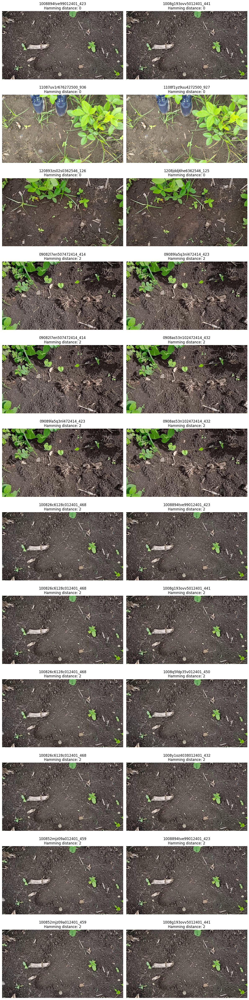


Contact sheet saved to:
/content/drive/MyDrive/dissertation_weed_detection/01_data/processed/quality_checks/near_duplicate_contact_sheet.png


In [14]:
# Step 13: Generate actual near-duplicate contact sheet

import matplotlib.pyplot as plt
from PIL import Image

# Select strongest candidates

# Take the 12 closest candidate pairs
candidate_pairs_sorted = sorted(
    near_duplicate_pairs,
    key=lambda x: x[2])

selected_pairs = candidate_pairs_sorted[:12]

# Map image IDs to paths
image_path_map = dict(
    zip(manifest["image_id"], manifest["image_path"]))

# Create contact sheet

fig, axes = plt.subplots(
    nrows=len(selected_pairs),
    ncols=2,
    figsize=(12, 4 * len(selected_pairs)))

if len(selected_pairs) == 1:
    axes = np.array([axes])

for row_idx, (id_a, id_b, distance) in enumerate(selected_pairs):

    path_a = image_path_map[id_a]
    path_b = image_path_map[id_b]

    img_a = Image.open(path_a).convert("RGB")
    img_b = Image.open(path_b).convert("RGB")

    axes[row_idx, 0].imshow(img_a)
    axes[row_idx, 0].axis("off")
    axes[row_idx, 0].set_title(
        f"{id_a}\nHamming distance: {distance}")

    axes[row_idx, 1].imshow(img_b)
    axes[row_idx, 1].axis("off")
    axes[row_idx, 1].set_title(
        f"{id_b}\nHamming distance: {distance}")

plt.tight_layout()

# Save to project

QA_DIR = PROCESSED_DIR / "quality_checks"
QA_DIR.mkdir(parents=True, exist_ok=True)

CONTACT_SHEET_PATH = QA_DIR / "near_duplicate_contact_sheet.png"

plt.savefig(
    CONTACT_SHEET_PATH,
    dpi=150,
    bbox_inches="tight")

plt.show()

print("\nContact sheet saved to:")
print(CONTACT_SHEET_PATH)

In [15]:
# ============================================================
# Step 14: Build near-duplicate groups
# ============================================================

from collections import defaultdict

# ------------------------------------------------------------
# Union-Find structure
# ------------------------------------------------------------

parent = {image_id: image_id for image_id in image_ids}


def find(x):
    while parent[x] != x:
        parent[x] = parent[parent[x]]
        x = parent[x]
    return x


def union(a, b):
    root_a = find(a)
    root_b = find(b)

    if root_a != root_b:
        parent[root_b] = root_a


# ------------------------------------------------------------
# Connect images that passed the pHash screening
# ------------------------------------------------------------

for id_a, id_b, distance in near_duplicate_pairs:
    union(id_a, id_b)


# ------------------------------------------------------------
# Construct groups
# ------------------------------------------------------------

groups = defaultdict(list)

for image_id in image_ids:
    groups[find(image_id)].append(image_id)


# Only groups containing >1 image are interesting
duplicate_groups = [
    members for members in groups.values()
    if len(members) > 1
]

duplicate_groups.sort(key=len, reverse=True)

# Summary

print("NEAR-DUPLICATE GROUP ANALYSIS")
print("=" * 70)

print("Total images                  :", len(image_ids))
print("Near-duplicate candidate pairs:", len(near_duplicate_pairs))
print("Near-duplicate groups         :", len(duplicate_groups))
print(
    "Images belonging to groups    :",
    sum(len(g) for g in duplicate_groups)
)

print("\nGROUP SIZE DISTRIBUTION")
print("=" * 70)

size_counts = Counter(len(g) for g in duplicate_groups)

for size, count in sorted(size_counts.items()):
    print(f"{size:3} images : {count:3} groups")


print("\nLARGEST GROUPS")
print("=" * 70)

for i, group in enumerate(duplicate_groups[:20], start=1):
    print(f"\nGroup {i}: {len(group)} images")

    for image_id in group[:10]:
        print(" ", image_id)

    if len(group) > 10:
        print("  ...")

NEAR-DUPLICATE GROUP ANALYSIS
Total images                  : 6656
Near-duplicate candidate pairs: 326
Near-duplicate groups         : 134
Images belonging to groups    : 351

GROUP SIZE DISTRIBUTION
  2 images :  98 groups
  3 images :  22 groups
  4 images :   3 groups
  5 images :   2 groups
  6 images :   2 groups
  7 images :   4 groups
  8 images :   2 groups
 11 images :   1 groups

LARGEST GROUPS

Group 1: 11 images
  1108666p1gt7232419_657
  11086v0252a9232419_747
  1108767996xw232419_684
  11087fli677k232419_702
  1108atppqu9c232419_738
  1108fpnsywx6232419_693
  1108g0cws11r232419_711
  1108q5l311yr232419_666
  1108x2dn007h232419_720
  1108x8oabtfc232419_729
  ...

Group 2: 8 images
  100826c6128c012401_468
  100852mjz09a012401_459
  100864d4kqi0012401_414
  1008894tve99012401_423
  1008g193ovv5012401_441
  1008q5fdp35v012401_450
  1008xxqaj9wi012401_477
  1008y1oz4038012401_432

Group 3: 8 images
  11083z9cscs2392548_342
  11085h58k255392548_360
  11087t66h5c6392548_396
  1

In [16]:
# ============================================================
# Step 15: Create persistent near-duplicate group assignments
# ============================================================

# Rebuild groups from the Union-Find structure
# so that every image receives exactly one group ID.

all_groups = defaultdict(list)

for image_id in image_ids:
    all_groups[find(image_id)].append(image_id)


# ------------------------------------------------------------
# Sort groups deterministically
# ------------------------------------------------------------

sorted_groups = sorted(
    all_groups.values(),
    key=lambda g: (len(g), sorted(g)[0])
)


# ------------------------------------------------------------
# Assign group IDs
# ------------------------------------------------------------

image_to_group = {}

for group_number, members in enumerate(sorted_groups, start=1):

    group_id = f"NDG_{group_number:05d}"

    for image_id in members:
        image_to_group[image_id] = group_id


# ------------------------------------------------------------
# Add group information to manifest
# ------------------------------------------------------------

manifest["near_duplicate_group"] = manifest["image_id"].map(
    image_to_group
)


# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

print("NEAR-DUPLICATE GROUP ASSIGNMENT")
print("=" * 70)

print("Total images :", len(manifest))
print(
    "Images with group ID :",
    manifest["near_duplicate_group"].notna().sum()
)

print(
    "Unique groups :",
    manifest["near_duplicate_group"].nunique()
)

print(
    "Images in multi-image groups :",
    sum(
        len(group)
        for group in all_groups.values()
        if len(group) > 1
    )
)

print(
    "Singleton groups :",
    sum(
        1
        for group in all_groups.values()
        if len(group) == 1
    )
)


# ------------------------------------------------------------
# Save updated manifest
# ------------------------------------------------------------

manifest_path = PROCESSED_DIR / "dataset_manifest_with_groups.csv"

manifest.to_csv(
    manifest_path,
    index=False
)

print("\nSaved manifest:")
print(manifest_path)

print("\n✓ Every image has exactly one near-duplicate group.")

NEAR-DUPLICATE GROUP ASSIGNMENT
Total images : 6656
Images with group ID : 6656
Unique groups : 6439
Images in multi-image groups : 351
Singleton groups : 6305

Saved manifest:
/content/drive/MyDrive/dissertation_weed_detection/01_data/processed/dataset_manifest_with_groups.csv

✓ Every image has exactly one near-duplicate group.


In [17]:
# ============================================================
# Step 16: Class distribution across near-duplicate groups
# ============================================================

import json
from collections import Counter, defaultdict

# ------------------------------------------------------------
# Build image -> annotation path mapping
# ------------------------------------------------------------

annotation_map = dict(
    zip(
        manifest["image_id"],
        manifest["annotation_path"]
    )
)


# ------------------------------------------------------------
# Read classes present in each image
# ------------------------------------------------------------

image_classes = {}

for image_id, annotation_path in tqdm(
    annotation_map.items(),
    total=len(annotation_map),
    desc="Reading annotations"
):
    try:
        with open(annotation_path, "r") as f:
            annotations = json.load(f)

        classes = sorted(
            set(int(obj["class_id"]) for obj in annotations)
        )

        image_classes[image_id] = classes

    except Exception:
        image_classes[image_id] = []


# ------------------------------------------------------------
# Aggregate classes within each near-duplicate group
# ------------------------------------------------------------

group_classes = defaultdict(set)

for image_id, classes in image_classes.items():

    group_id = image_to_group[image_id]

    for class_id in classes:
        group_classes[group_id].add(class_id)


# ------------------------------------------------------------
# Count groups containing each class
# ------------------------------------------------------------

class_group_counts = Counter()

for group_id, classes in group_classes.items():

    for class_id in classes:
        class_group_counts[class_id] += 1


# ------------------------------------------------------------
# Count images containing each class
# ------------------------------------------------------------

class_image_counts = Counter()

for classes in image_classes.values():

    for class_id in classes:
        class_image_counts[class_id] += 1


# ------------------------------------------------------------
# Display
# ------------------------------------------------------------

print("CLASS DISTRIBUTION ACROSS GROUPS")
print("=" * 70)

print(
    f"{'Class ID':<10}"
    f"{'Images':>10}"
    f"{'Groups':>10}"
)

print("-" * 70)

for class_id in range(15):

    print(
        f"{class_id:<10}"
        f"{class_image_counts[class_id]:>10}"
        f"{class_group_counts[class_id]:>10}"
    )


# ------------------------------------------------------------
# Multi-class composition of groups
# ------------------------------------------------------------

composition_counts = Counter(
    tuple(sorted(classes))
    for classes in group_classes.values())

print("\nGROUP CLASS COMPOSITION")
print("=" * 70)

print(
    "Groups containing exactly 1 class :",
    sum(
        1 for classes in group_classes.values()
        if len(classes) == 1))

print(
    "Groups containing 2+ classes       :",
    sum(
        1 for classes in group_classes.values()
        if len(classes) >= 2))

print(
    "Maximum classes in one group       :",
    max(
        len(classes)
        for classes in group_classes.values()))

Reading annotations:   0%|          | 0/6656 [00:00<?, ?it/s]

CLASS DISTRIBUTION ACROSS GROUPS
Class ID      Images    Groups
----------------------------------------------------------------------
0               3377      3248
1               5059      4898
2               5546      5377
3               1356      1293
4               1021       972
5               1091      1063
6                173       164
7                186       180
8                615       592
9                721       707
10               343       336
11                88        85
12               333       315
13                55        55
14               228       223

GROUP CLASS COMPOSITION
Groups containing exactly 1 class : 553
Groups containing 2+ classes       : 5878
Maximum classes in one group       : 8


In [18]:
# ============================================================
# Step 17: Rare-class group availability analysis
# ============================================================

import math

TOTAL_GROUPS = len(all_groups)

print("RARE-CLASS GROUP AVAILABILITY")
print("=" * 70)

print(
    f"{'Class':<8}"
    f"{'Images':>10}"
    f"{'Groups':>10}"
    f"{'5%':>10}"
    f"{'10%':>10}"
    f"{'15%':>10}"
    f"{'20%':>10}"
)

print("-" * 70)

for class_id in range(15):

    n_images = class_image_counts[class_id]
    n_groups = class_group_counts[class_id]

    # Expected number of class-containing groups at different
    # split proportions.
    five  = n_groups * 0.05
    ten   = n_groups * 0.10
    fifteen = n_groups * 0.15
    twenty  = n_groups * 0.20

    print(
        f"{class_id:<8}"
        f"{n_images:>10}"
        f"{n_groups:>10}"
        f"{five:>10.1f}"
        f"{ten:>10.1f}"
        f"{fifteen:>10.1f}"
        f"{twenty:>10.1f}"
    )


print("\nTOTAL GROUPS:", TOTAL_GROUPS)

print("\nRARE CLASS SUMMARY")
print("=" * 70)

# Sort classes by number of groups
rare_classes = sorted(
    class_group_counts.items(),
    key=lambda x: x[1]
)

for class_id, n_groups in rare_classes:

    print(
        f"Class {class_id:2d}: "
        f"{n_groups:4d} groups | "
        f"5%={n_groups*0.05:5.1f} | "
        f"10%={n_groups*0.10:5.1f} | "
        f"15%={n_groups*0.15:5.1f} | "
        f"20%={n_groups*0.20:5.1f}")

RARE-CLASS GROUP AVAILABILITY
Class       Images    Groups        5%       10%       15%       20%
----------------------------------------------------------------------
0             3377      3248     162.4     324.8     487.2     649.6
1             5059      4898     244.9     489.8     734.7     979.6
2             5546      5377     268.9     537.7     806.5    1075.4
3             1356      1293      64.7     129.3     193.9     258.6
4             1021       972      48.6      97.2     145.8     194.4
5             1091      1063      53.2     106.3     159.4     212.6
6              173       164       8.2      16.4      24.6      32.8
7              186       180       9.0      18.0      27.0      36.0
8              615       592      29.6      59.2      88.8     118.4
9              721       707      35.4      70.7     106.0     141.4
10             343       336      16.8      33.6      50.4      67.2
11              88        85       4.2       8.5      12.8      17.0
12

In [19]:
# ============================================================
# Step 18: Candidate split-size analysis
# ============================================================

TOTAL_IMAGES = len(manifest)
TOTAL_GROUPS = manifest["near_duplicate_group"].nunique()

split_options = {
    "80/10/10": (0.80, 0.10, 0.10),
    "75/10/15": (0.75, 0.10, 0.15),
    "70/15/15": (0.70, 0.15, 0.15),
}

print("CANDIDATE SPLIT ANALYSIS")
print("=" * 80)

print(f"Total images : {TOTAL_IMAGES}")
print(f"Total groups : {TOTAL_GROUPS}")

print()

for name, (train_p, val_p, test_p) in split_options.items():

    train_images = round(TOTAL_IMAGES * train_p)
    val_images   = round(TOTAL_IMAGES * val_p)
    test_images  = TOTAL_IMAGES - train_images - val_images

    train_groups = round(TOTAL_GROUPS * train_p)
    val_groups   = round(TOTAL_GROUPS * val_p)
    test_groups  = TOTAL_GROUPS - train_groups - val_groups

    print(name)
    print("-" * 80)

    print(
        f"  Images : "
        f"Train={train_images:,} | "
        f"Val={val_images:,} | "
        f"Test={test_images:,}"
    )

    print(
        f"  Groups : "
        f"Train={train_groups:,} | "
        f"Val={val_groups:,} | "
        f"Test={test_groups:,}"
    )

    print()

CANDIDATE SPLIT ANALYSIS
Total images : 6656
Total groups : 6439

80/10/10
--------------------------------------------------------------------------------
  Images : Train=5,325 | Val=666 | Test=665
  Groups : Train=5,151 | Val=644 | Test=644

75/10/15
--------------------------------------------------------------------------------
  Images : Train=4,992 | Val=666 | Test=998
  Groups : Train=4,829 | Val=644 | Test=966

70/15/15
--------------------------------------------------------------------------------
  Images : Train=4,659 | Val=998 | Test=999
  Groups : Train=4,507 | Val=966 | Test=966



In [20]:
# ============================================================
# Step 19: Analyze image acquisition/source structure
# ============================================================

from pathlib import Path
from collections import Counter

def infer_source(path):
    path = str(path).lower()

    if "intel real sense" in path:
        return "Intel RealSense"

    if "canon camera" in path:
        return "Canon"

    if "iphone" in path:
        return "iPhone"

    if "uav" in path:
        return "UAV"

    return "Unknown"


manifest["source"] = manifest["image_path"].apply(infer_source)

print("IMAGE SOURCE DISTRIBUTION")
print("=" * 70)

source_counts = manifest["source"].value_counts()

for source, count in source_counts.items():
    print(f"{source:<20} {count:>6}")

print("\n")

# ------------------------------------------------------------
# Source × class analysis
# ------------------------------------------------------------

print("SOURCE / CLASS DISTRIBUTION")
print("=" * 70)

source_class_counts = defaultdict(Counter)

for _, row in manifest.iterrows():

    image_id = row["image_id"]
    source = row["source"]

    for class_id in image_classes.get(image_id, []):
        source_class_counts[source][class_id] += 1


for source in source_counts.index:

    print(f"\n{source}")
    print("-" * 50)

    for class_id in range(15):
        print(
            f"Class {class_id:2d}: "
            f"{source_class_counts[source][class_id]:>6}"
        )

IMAGE SOURCE DISTRIBUTION
Intel RealSense        6656


SOURCE / CLASS DISTRIBUTION

Intel RealSense
--------------------------------------------------
Class  0:   3377
Class  1:   5059
Class  2:   5546
Class  3:   1356
Class  4:   1021
Class  5:   1091
Class  6:    173
Class  7:    186
Class  8:    615
Class  9:    721
Class 10:    343
Class 11:     88
Class 12:    333
Class 13:     55
Class 14:    228


In [21]:
# ============================================================
# Step 20: Investigate filename components as possible
# acquisition/session identifiers
# ============================================================

import re
from collections import Counter, defaultdict

filenames = manifest["image_filename"].tolist()

print("FILENAME STRUCTURE INVESTIGATION")
print("=" * 70)

# ------------------------------------------------------------
# Extract the portion after the underscore
# ------------------------------------------------------------

suffixes = []

for filename in filenames:
    stem = Path(filename).stem
    parts = stem.split("_")

    if len(parts) >= 2:
        suffixes.append(parts[-1])

print("Unique suffixes :", len(set(suffixes)))
print()

print("MOST COMMON SUFFIXES")
print("-" * 70)

for value, count in Counter(suffixes).most_common(30):
    print(f"{value:<10} {count:>6}")


# ------------------------------------------------------------
# Extract the characters immediately before the underscore
# ------------------------------------------------------------

prefix_before_underscore = []

for filename in filenames:

    stem = Path(filename).stem
    parts = stem.split("_")

    if len(parts) >= 2:
        prefix_before_underscore.append(parts[-2])

print("\n")
print("PREFIX BEFORE UNDERSCORE")
print("-" * 70)

length_distribution = Counter(
    len(x) for x in prefix_before_underscore
)

for length, count in sorted(length_distribution.items()):
    print(
        f"Length {length:2d}: "
        f"{count:>6} filenames"
    )


# ------------------------------------------------------------
# Look for repeated internal substrings
# ------------------------------------------------------------

print("\n")
print("COMMON 6-DIGIT SUBSTRINGS")
print("-" * 70)

substring_counts = Counter()

for filename in filenames:

    stem = Path(filename).stem

    # all numeric substrings of length 6
    matches = re.findall(r"\d{6}", stem)

    for match in matches:
        substring_counts[match] += 1

for value, count in substring_counts.most_common(30):
    print(f"{value:<10} {count:>6}")

FILENAME STRUCTURE INVESTIGATION
Unique suffixes : 184

MOST COMMON SUFFIXES
----------------------------------------------------------------------
153           115
126           101
144            98
108            98
171            94
117            92
135            91
162            90
180            50
909            45
918            45
103            44
234            44
225            43
102            42
648            42
154            42
100            42
270            42
288            41
279            41
423            40
900            40
123            40
120            40
104            40
594            40
152            40
306            40
45.            40


PREFIX BEFORE UNDERSCORE
----------------------------------------------------------------------
Length 18:   6656 filenames


COMMON 6-DIGIT SUBSTRINGS
----------------------------------------------------------------------
592508         54
272453         52
482526         52
012508         52
112429         

In [22]:
# ============================================================
# FINAL FILENAME / ACQUISITION STRUCTURE INVESTIGATION

import re
import pandas as pd

filenames = manifest["image_filename"].tolist()

# ------------------------------------------------------------
# 1. Extract filename components
# ------------------------------------------------------------

records = []

for filename in filenames:
    stem = Path(filename).stem
    parts = stem.split("_")

    records.append({
        "filename": filename,
        "stem": stem,
        "length": len(stem),
        "prefix_5": stem[:5],
        "prefix_6": stem[:6],
        "prefix_8": stem[:8],
        "before_underscore": parts[0] if len(parts) >= 1 else None,
        "suffix": parts[-1] if len(parts) >= 2 else None,
        "numeric_6": re.findall(r"\d{6}", stem)
    })

fname_df = pd.DataFrame(records)

print("FILENAME / ACQUISITION STRUCTURE")
print("=" * 70)

print(f"Total filenames       : {len(fname_df)}")
print(f"Unique filenames      : {fname_df['filename'].nunique()}")
print(f"Filename lengths      : {fname_df['length'].unique()}")
print()


# ------------------------------------------------------------
# 2. Check 6-digit components
# ------------------------------------------------------------

six_digit_counter = Counter()

for values in fname_df["numeric_6"]:
    for value in values:
        six_digit_counter[value] += 1

print("6-DIGIT COMPONENTS")
print("-" * 70)

print(f"Unique 6-digit values : {len(six_digit_counter)}")
print()

for value, count in six_digit_counter.most_common(30):
    print(f"{value:<10} {count:>5} images")

print()


# ------------------------------------------------------------
# 3. How many images share the same 6-digit component?
# ------------------------------------------------------------

component_groups = defaultdict(list)

for _, row in fname_df.iterrows():
    for value in row["numeric_6"]:
        component_groups[value].append(row["filename"])

group_sizes = Counter(
    len(images)
    for images in component_groups.values()
)

print("6-DIGIT COMPONENT GROUP SIZES")
print("-" * 70)

for size, count in sorted(group_sizes.items()):
    print(f"{size:>4} images/group : {count:>5} groups")

print()


# ------------------------------------------------------------
# 4. Inspect representative groups
# ------------------------------------------------------------

print("REPRESENTATIVE 6-DIGIT GROUPS")
print("-" * 70)

# Show groups containing at least 5 images
large_groups = [
    (component, images)
    for component, images in component_groups.items()
    if len(images) >= 5
]

large_groups = sorted(
    large_groups,
    key=lambda x: len(x[1]),
    reverse=True
)

for component, images in large_groups[:15]:

    print(f"\nComponent: {component}")
    print(f"Images   : {len(images)}")

    for filename in images[:10]:
        print(f"  {filename}")

    if len(images) > 10:
        print("  ...")


# ------------------------------------------------------------
# 5. Compare 6-digit component with near-duplicate groups
# ------------------------------------------------------------

print("\n")
print("ACQUISITION COMPONENT vs NEAR-DUPLICATE GROUPS")
print("=" * 70)

if "near_duplicate_group" in manifest.columns:

    # Build lookup
    lookup = manifest[
        ["image_filename", "near_duplicate_group"]
    ].copy()

    lookup = lookup.merge(
        fname_df[["filename", "numeric_6"]],
        left_on="image_filename",
        right_on="filename",
        how="left"
    )

    component_to_groups = defaultdict(set)

    for _, row in lookup.iterrows():

        groups = row["numeric_6"]

        if not isinstance(groups, list):
            continue

        for component in groups:
            component_to_groups[component].add(
                row["near_duplicate_group"]
            )

    # Calculate whether a component mostly maps to one
    # near-duplicate group or many groups.

    component_stats = []

    for component, groups in component_to_groups.items():

        image_count = len(component_groups[component])

        component_stats.append({
            "component": component,
            "images": image_count,
            "near_duplicate_groups": len(groups)
        })

    component_stats_df = pd.DataFrame(component_stats)

    print(
        component_stats_df
        .sort_values("images", ascending=False)
        .head(30)
        .to_string(index=False)
    )

else:

    print(
        "near_duplicate_group column not found in manifest."
    )


# ------------------------------------------------------------
# 6. Important conclusion
# ------------------------------------------------------------

print("\n")
print("=" * 70)
print("INTERPRETATION")
print("=" * 70)

print("""
This analysis does NOT assume that any filename component is
an acquisition/session identifier.

We are checking whether repeated filename components show a
consistent relationship with groups of visually similar images.

If a component consistently identifies one acquisition sequence,
we may use it as a higher-level grouping variable for dataset
splitting.

If not, the near-duplicate groups will remain our primary
leakage-control mechanism.
""")

FILENAME / ACQUISITION STRUCTURE
Total filenames       : 6656
Unique filenames      : 6656
Filename lengths      : [22]

6-DIGIT COMPONENTS
----------------------------------------------------------------------
Unique 6-digit values : 2880

592508        54 images
272453        52 images
482526        52 images
012508        52 images
112429        49 images
012401        48 images
362406        47 images
352544        46 images
502541        45 images
122431        44 images
062534        43 images
062404        39 images
092538        38 images
342507        38 images
152459        37 images
392548        37 images
502500        37 images
292456        37 images
032405        36 images
222554        36 images
492527        36 images
052403        36 images
372408        35 images
392518        34 images
232555        33 images
182402        32 images
472557        32 images
462556        32 images
142509        32 images
352513        31 images

6-DIGIT COMPONENT GROUP SIZES
--------

## Dataset Investigation Conclusion

The MH-Weed16 detection subset contains 6,656 images with 62,052
bounding-box annotations across 15 detection classes.

All images are readable and all 6,656 images have corresponding
JSON and TXT annotations. JSON and TXT annotations are identical
for every image. XML annotations were investigated but are not
used as the canonical ground truth.

No exact duplicate images were detected.

Near-duplicate analysis identified 326 candidate image pairs,
forming 134 multi-image near-duplicate groups containing 351
images. Visual inspection indicated that these are predominantly
different frames/views of the same scene.

Filename analysis identified repeated numeric components, but
these components do not consistently correspond to individual
near-duplicate groups. Therefore, they are not treated as reliable
acquisition/session identifiers.

For leakage prevention, the near-duplicate group is therefore
used as the splitting unit. Images belonging to the same
near-duplicate group must remain within the same train,
validation, or test partition.

The next notebook will construct the final leakage-aware dataset
split and prepare the YOLO training structure.